**Image Processing Laboratory (045108) - Meeting 3/4**  

Signal and Image Processing Lab (SIPL) & Vision and Image Sciences Lab (VISL)  
The Andrew and Erna Viterbi Faculty of Electrical and Computer Engineering    
Technion - Israel Institute of Technology

In [16]:
from collections import namedtuple, Counter
import os
import numpy as np
from scipy import fft
from scipy.io import loadmat
from skimage import color, io, measure, metrics, transform, util
from dahuffman import HuffmanCodec
import matplotlib.pyplot as plt

from lab_code.block_process import block_process
from lab_code.zigzag import zigzag, izigzag
from lab_code.im_preparation import visual_prep, thermal_prep_uint8

# Set to True to run the notebook without waiting for user interaction
DISABLE_GUI = False


# Preparation - Assignment 1 - Getting to Know the block_process Function

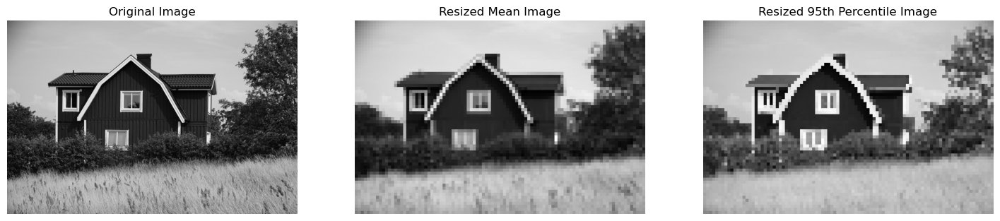

In [17]:
# Load input image
prep_image = io.imread('C:/Users/ompal/Desktop/meet3/images/8/prep.png')   ###########
prep_image = color.rgb2gray(prep_image)

# Create a function handle to functions for mean and percentile calculation
mean_function_handle = np.mean
percentile_function_handle = np.percentile

# TODO: Use the 'block_process' function to get the mean image of every 8x8 block and
#       the 95% percentile image of every 8x8 block
block_size = (8 , 8)   ###########
mean_image = block_process(prep_image, block_size, mean_function_handle)    #############
percentile_image = block_process(prep_image, block_size, percentile_function_handle, 95)  ########## או q=95 אם ה־block_process מעביר בקווארגס

# Resize the mean and percentile images to the size of the original image
# using nearest neighbor interpolation
resized_mean_image = transform.resize(mean_image, prep_image.shape, order=0, anti_aliasing=False, preserve_range=True)
resized_percentile_image = transform.resize(percentile_image, prep_image.shape, order=0, anti_aliasing=False, preserve_range=True)

# Show the original, and the resized mean and percentile images
plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1)
plt.imshow(prep_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(resized_mean_image, cmap='gray')
plt.title('Resized Mean Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(resized_percentile_image, cmap='gray')
plt.title('Resized 95th Percentile Image')
plt.axis('off')
plt.show()


# Preparation - Assignment 3 - Differential Coding

In [18]:
# Question 1

def diff_coding(data, distance=1):
    """
    Calculates the differential code of a vector.

    Args:
        data (np.ndarray): The input  vector.
        distance(int, optional): The distance between elements to subtract.
            Defaults to 1.

    Returns:
        np.ndarray with the differential code vector.
    """

    # If distance is 0, return input data unchanged
    if distance == 0:
        return np.copy(data)

    # Convert to a signed datatype to allow negative difference values
    data_int16 = data.astype(np.int16)

    code = np.zeros_like(data_int16)
    # Copy first distance elements
    code[:distance] = data_int16[:distance]

    # TODO: Calculate the differential code for the remaining elements
    for i in range(distance, len(data_int16)):   ##########
        code[i] = data_int16[i] - data_int16[i - distance]  ##########
    return code


def diff_decoding(code, distance):
    """
    Reconstructs a vector from differential code.

    Args:
        code (np.ndarray): The differential code vector.
        distance (int): Distance between elements subtracted.

    Returns:
        np.ndarray with the reconstructed vector.
    """

    # If distance is 0, return input data unchanged
    if distance == 0:
        return np.copy(code)

    rows_num = code.shape[0]

    data = np.copy(code)

    # Copy first distance elements
    data[:distance] = code[:distance]

    # TODO: Recostruct the remaining elements
    for i in range(distance, len(code)):     ##########
        data[i] = code[i] + data[i - distance]    #########
    return data


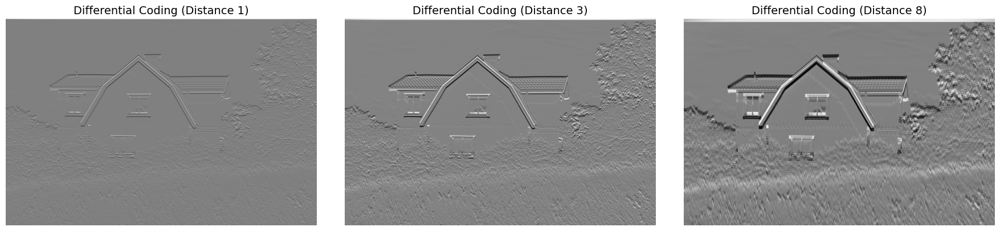

In [19]:
# Question 2

prep_image = util.img_as_ubyte(prep_image)

# TODO: Perform differential coding for prep_image with distances 1, 3, and 8.
prep_diff_coding_1 = diff_coding(prep_image, distance=1)     ##########
prep_diff_coding_3 = diff_coding(prep_image, distance=3)     ##########
prep_diff_coding_8 = diff_coding(prep_image, distance=8)     ##########

# Show the results
plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1)
plt.imshow(prep_diff_coding_1, cmap='gray')
plt.title('Differential Coding (Distance 1)', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(prep_diff_coding_3, cmap='gray')
plt.title('Differential Coding (Distance 3)', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(prep_diff_coding_8, cmap='gray')
plt.title('Differential Coding (Distance 8)', fontsize=14)
plt.axis('off')

plt.tight_layout()
plt.show()


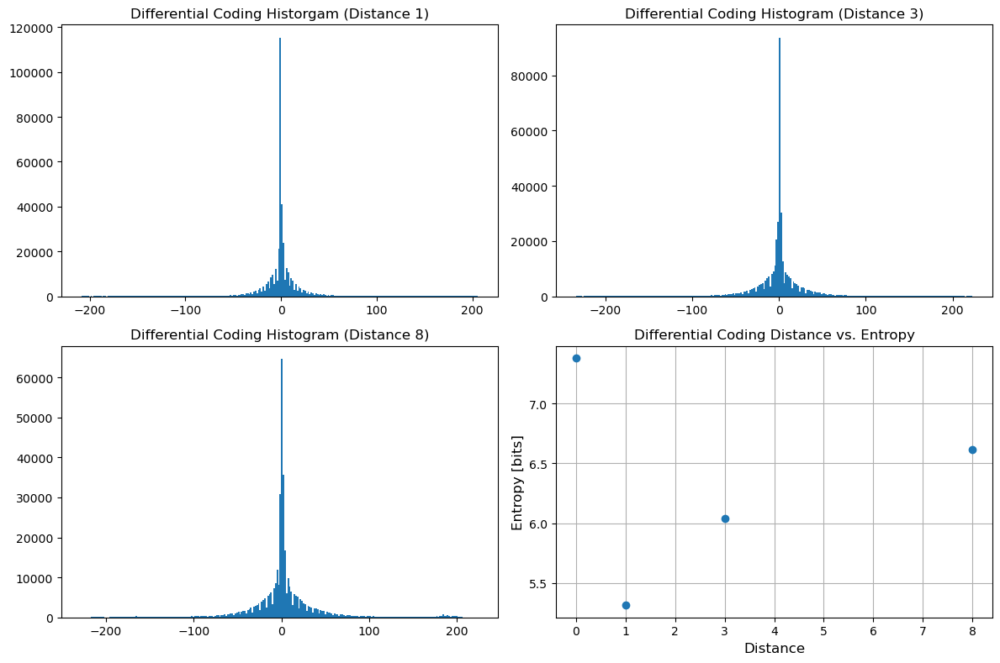

In [20]:
from skimage.measure import shannon_entropy

# Question 3

# TODO: Show differential coding histograms
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.hist(prep_diff_coding_1.ravel(), bins=256) #########
plt.title('Differential Coding Historgam (Distance 1)', fontsize=12)

plt.subplot(2, 2, 2)
plt.hist(prep_diff_coding_3.ravel(), bins=256) #########
plt.title('Differential Coding Histogram (Distance 3)', fontsize=12)

plt.subplot(2, 2, 3)
plt.hist(prep_diff_coding_8.ravel(), bins=256) #########
plt.title('Differential Coding Histogram (Distance 8)', fontsize=12)


distances = [0, 1, 3, 8]
# TODO: Calculate entropy using the 'measure.shannon_entropy' function
entropy = [                                     ##########
    shannon_entropy(prep_image),                ##########
    shannon_entropy(prep_diff_coding_1),        ##########
    shannon_entropy(prep_diff_coding_3),        ##########
    shannon_entropy(prep_diff_coding_8)         ##########
]                                               ##########

# Show entropy
plt.subplot(2, 2, 4)
plt.plot(distances, entropy, marker='o', linestyle='None')
plt.title('Differential Coding Distance vs. Entropy', fontsize=12)
plt.xlabel('Distance', fontsize=12)
plt.ylabel('Entropy [bits]', fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()


# Preparation - Assignment 4 - Quantization

In [21]:
# Question 1

def im_quantize(image, levels_num):
    """
    Quantizes an image to a specified number of intensity levels.

    This function takes a grayscale image as input and reduces the number of unique
    intensity values to the specified number of levels. It achieves this by dividing
    the original intensity range into equal-sized buckets and assigning each pixel's
    intensity to the midpoint of the bucket it falls into.

    Args:
      image (np.ndarray): The input grayscale image.
      levels_num (int): The desired number of quantization levels. Must be a power of 2.

    Returns:
      A tuple containing the quantized image (np.ndarray) and the compression ratio
      achieved by quantization (float).
    """

    quantized_image = np.copy(image)

    # TODO: Get minimum and maximum intensity values
    min_intensity  = image.min()   #######
    max_intensity  = image.max()   #######

    # TODO: Create an array of evenly spaced intensity bin edges
    bin_edges = np.linspace(min_intensity, max_intensity, levels_num + 1)  #########

    # TODO: Quantize the image
    for i in range(len(bin_edges) - 1):
        quantized_image[(image >= bin_edges[i]) & (image < bin_edges[i + 1])] = (bin_edges[i + 1] + bin_edges[i]) / 2  ##########

    # Calculate the compression ratio
    compression_ratio  = np.log2(max_intensity  - min_intensity  + 1.0) / np.log2(levels_num)

    return quantized_image, compression_ratio


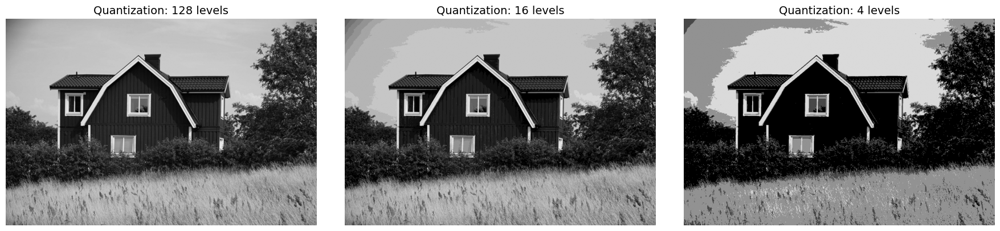

Compression ratios for 128, 16, 4 levels: 1.14, 1.99, 3.99
PSNR [dB] for 128, 16, 4 levels: 51.08, 35.07, 22.7
SSIM for 128, 16, 4 levels: 1.0, 0.95, 0.73


In [22]:
# Question 2

# TODO: Quantize prep_image to 128, 16 and 4 levels
prep_quantized_128levels, compression_ratio_128levels = im_quantize(prep_image, 128)   
prep_quantized_16levels, compression_ratio_16levels = im_quantize(prep_image, 16)   
prep_quantized_4levels, compression_ratio_4levels = im_quantize(prep_image, 4)

# TODO: Compute PSNR & SSIM using the 'metrics.peak_signal_noise_ratio' &
#       'metrics.structural_similarity' functions
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
psnr_128levels = peak_signal_noise_ratio(prep_image, prep_quantized_128levels)
psnr_16levels = peak_signal_noise_ratio(prep_image, prep_quantized_16levels)
psnr_4levels = peak_signal_noise_ratio(prep_image, prep_quantized_4levels)
ssim_128levels = structural_similarity(prep_image, prep_quantized_128levels)
ssim_16levels = structural_similarity(prep_image, prep_quantized_16levels)
ssim_4levels = structural_similarity(prep_image, prep_quantized_4levels)

# Show quantized images
plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1)
plt.imshow(prep_quantized_128levels, cmap='gray')
plt.title('Quantization: 128 levels', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(prep_quantized_16levels, cmap='gray')
plt.title('Quantization: 16 levels', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(prep_quantized_4levels, cmap='gray')
plt.title('Quantization: 4 levels', fontsize=14)
plt.axis('off')

plt.tight_layout()
plt.show()

# Print compression ratios
print(f"Compression ratios for 128, 16, 4 levels: {compression_ratio_128levels:.2f}, {compression_ratio_16levels:.2f}, {compression_ratio_4levels:.2f}")

# Print PSNR & SSIM values
print(f"PSNR [dB] for 128, 16, 4 levels: {round(psnr_128levels,2)}, {round(psnr_16levels,2)}, {round(psnr_4levels,2)}")
print(f"SSIM for 128, 16, 4 levels: {round(ssim_128levels,2)}, {round(ssim_16levels,2)}, {round(ssim_4levels,2)}")


# Preparation - Assignment 5 - DCT

In [23]:
def crop(image, block_size, corner):
    """
    Crops a block of given size from the image starting at the specificed corner.

  Args:
      image (np.ndarray): The image to crop.
      block_size (int): The size of the block to crop.
      corner (tuple of ints): (y,x) Xoordinates of the top-left corner of the block to crop.

  Returns:
      np.ndarray of the cropped block.
  """

    block =  image[corner.y:corner.y + block_size, corner.x:corner.x + block_size]

    return block


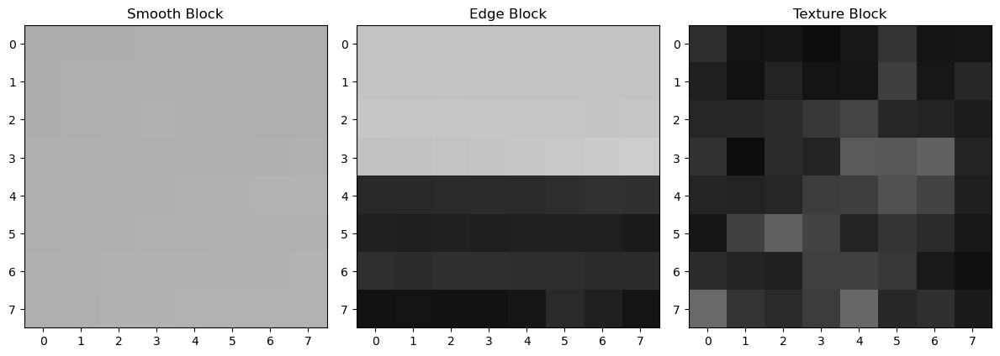

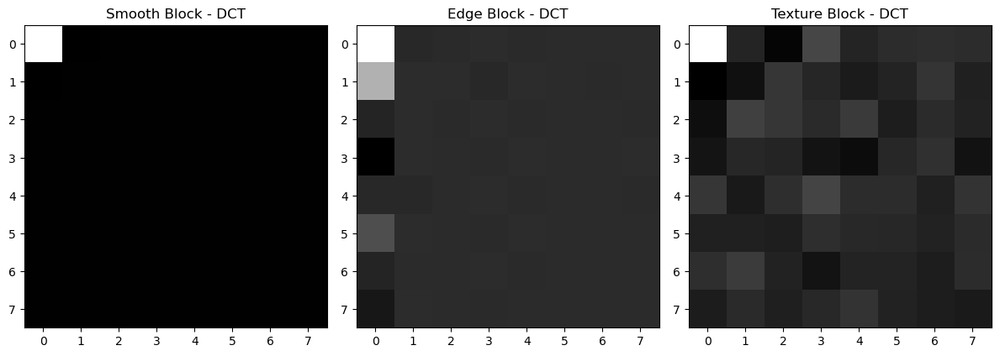

In [24]:
# Question 1

# Define block size and corner coordinates
block_corner = namedtuple('Corner', ['x','y'])
block_size = 8

# TODO: Choose three blocks from prep_image
smooth_block_corner = block_corner(x=50, y=50)     # שמיים
edge_block_corner = block_corner(x=220, y=134)   # קו גג
texture_block_corner = block_corner(x=100, y=300)   # עשב/שיחים

# TODO: Extract blocks from the image
smooth_block = crop(prep_image, block_size, smooth_block_corner)
edge_block = crop(prep_image, block_size, edge_block_corner)
texture_block = crop(prep_image, block_size, texture_block_corner)

# Show blocks
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(smooth_block, cmap='gray', vmin=0, vmax=255)
plt.title('Smooth Block')
plt.subplot(1, 3, 2)
plt.imshow(edge_block, cmap='gray', vmin=0, vmax=255)
plt.title('Edge Block')
plt.subplot(1, 3, 3)
plt.imshow(texture_block, cmap='gray', vmin=0, vmax=255)
plt.title('Texture Block')
plt.tight_layout()
plt.show()

# Perform DCT on the three blocks
smooth_block_dct = fft.dctn(smooth_block, norm='ortho')
edge_block_dct = fft.dctn(edge_block, norm='ortho')
texture_block_dct = fft.dctn(texture_block, norm='ortho')

# Show DCT coefficients
plt.figure(figsize=(12, 4))

plt.subplot(1,3,1)
plt.imshow(smooth_block_dct, cmap='gray')
plt.title('Smooth Block - DCT')
plt.subplot(1,3,2)
plt.imshow(edge_block_dct, cmap='gray')
plt.title('Edge Block - DCT')
plt.subplot(1,3,3)
plt.imshow(texture_block_dct, cmap='gray')
plt.title('Texture Block - DCT')
plt.tight_layout()
plt.show()


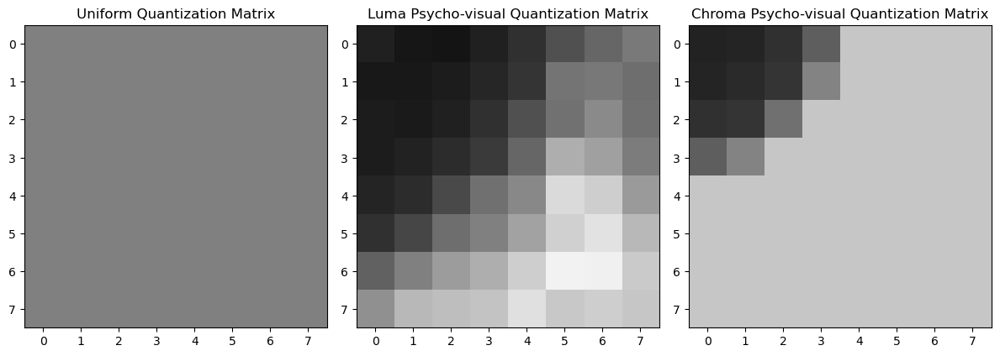

In [25]:
# Question 2

# Display quantization matrices
qmatrices = loadmat("lab_code/quantization_matrices.mat")

uniform_qmatrix = qmatrices["uniform"]
psyvisual_qmatrix = qmatrices["psyvisual"]
chroma_qmatrix = qmatrices["chroma"]

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(uniform_qmatrix, cmap="gray", vmin=0, vmax=32)
plt.title('Uniform Quantization Matrix')

plt.subplot(1,3,2)
plt.imshow(psyvisual_qmatrix, cmap="gray", vmin=0, vmax=128)
plt.title('Luma Psycho-visual Quantization Matrix')

plt.subplot(1,3,3)
plt.imshow(chroma_qmatrix, cmap="gray", vmin=0, vmax=128)
plt.title('Chroma Psycho-visual Quantization Matrix')

plt.tight_layout()
plt.show()


In [26]:
# Question 3

if not DISABLE_GUI:
    # Run Block-DCT viewer app
    !python lab_code/dct_viewer_app.py


In [27]:

# Question 4

def dct_quantize(image_block, qmatrix, qf):
    """
    Performs DCT (Discrete Cosine Transform) and quantization on an image block.

    Args:
      image_block (np.ndarray): The image block.
      qmatrix (np.ndarray): The quantization matrix.
      qf (float): The quality factor for scaling.

    Returns:
      np.ndarray of the DCT transformed and quantized image block.
    """

    # TODO: Perform DCT on the image block using the 'fft.dctn' function with parameter
    #       'norm='ortho''
    dct_block = fft.dctn(image_block, norm='ortho')

    # TODO: Perform quantization using qmatrix and scaling using qf
    quantized_block = dct_block / (qmatrix * qf)

    return np.round(quantized_block).astype(int)


def dequantize_idct(coded_block, qmatrix, qf):
    """
    Performs dequantization and inverse DCT (Discrete Cosine Transform) on a coded
    block.

    Args:
      coded_block (np.ndarray): The coded image block.
      qmatrix (np.ndarray): The quantization matrix.
      qf (float): The quality factor for scaling.

    Returns:
      np.ndarray of the reconstructed image block.
    """

    # TODO: Perform inverse scaling using qf and dequantization using qmatrix
    dequantized_block = coded_block * (qmatrix * qf)

    # TODO: Perform inverse DCT on the dequantized image block using the 'fft.idctn'
    #       function with parameter 'norm='ortho''
    reconstructed_block  = fft.idctn(dequantized_block, norm='ortho')

    return np.round(reconstructed_block).astype(int)


# Preparation - Assignment 6 - Color Image Coding

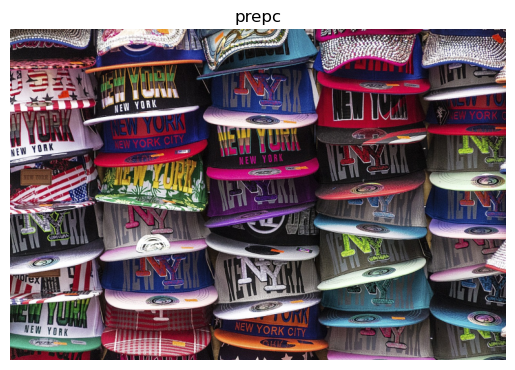

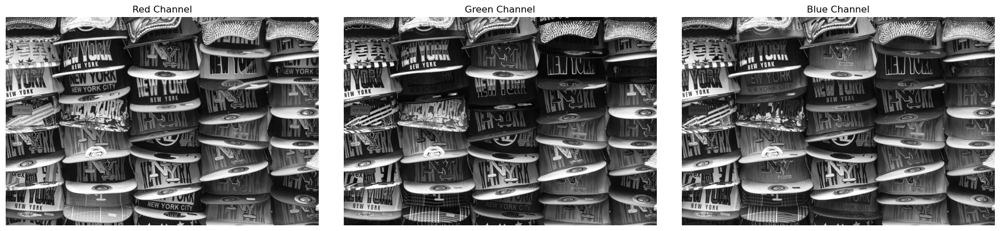

Covariance between RGB channels:
[[4895.16 3924.33 3692.92]
 [3924.33 4643.5  4130.91]
 [3692.92 4130.91 4345.06]]


In [28]:
# Question 1

# Load and show the image
prepc_image = io.imread('C:/Users/ompal/Desktop/meet3/images/8/prepc.png')

plt.imshow(prepc_image)
plt.title('prepc')
plt.axis('off')
plt.show()

# TODO: Extract RGB channels
red_channel = prepc_image[:, :, 0]
green_channel = prepc_image[:, :, 1]
blue_channel = prepc_image[:, :, 2]

# Show RGB channels
plt.figure(figsize=(18,4))

plt.subplot(1,3,1)
plt.imshow(red_channel, cmap="gray")
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(green_channel, cmap="gray")
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(blue_channel, cmap="gray")
plt.title('Blue Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

# TODO: Create a matrix that contains the RGB channels as its rows using the
#       'np.reshape' function
rgb_matrix = np.vstack([red_channel.ravel(), green_channel.ravel(), blue_channel.ravel()])

# Compute and print the covariance between the RGB channels
print("Covariance between RGB channels:")
rgb_covariance = np.cov(rgb_matrix)
print(np.round(rgb_covariance, 2))


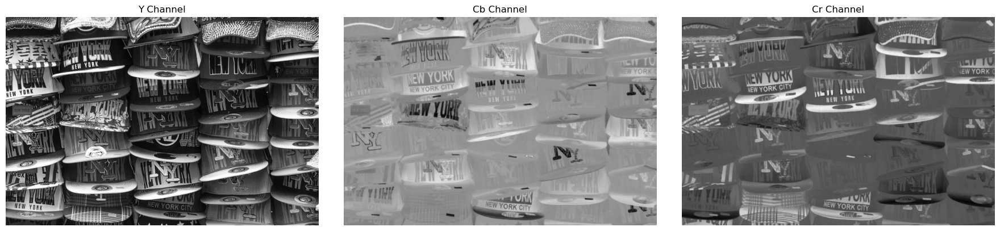

Covariance between YCbCr channels:
[[3154.08 -107.25  -47.37]
 [-107.25  140.71  -75.6 ]
 [ -47.37  -75.6   312.08]]


In [29]:
# Question 2

# Convert the RGB image to YCbCr
prepc_ycbcr = color.rgb2ycbcr(prepc_image)

# TODO: Extract YCbCr channels
y_channel = prepc_ycbcr[..., 0].astype(np.float32)
cb_channel = prepc_ycbcr[..., 1].astype(np.float32)
cr_channel = prepc_ycbcr[..., 2].astype(np.float32)

# Show YCbCr channels
plt.figure(figsize=(18,4))
plt.subplot(1,3,1)
plt.imshow(y_channel, cmap="gray")
plt.title('Y Channel')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(cb_channel, cmap="gray")
plt.title('Cb Channel')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cr_channel, cmap="gray")
plt.title('Cr Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

# TODO: Create a matrix that contains the YCbCr channels as its rows using the
#       'np.reshape' function
ycbcr_matrix = np.vstack([y_channel.ravel(), cb_channel.ravel(), cr_channel.ravel()])

# Compute and print the covariance between the YCbCr channels
print("Covariance between YCbCr channels:")
ycbcr_covariance = np.cov(ycbcr_matrix)
print(np.round(ycbcr_covariance, 2))


# Assignment 1 - Introduction

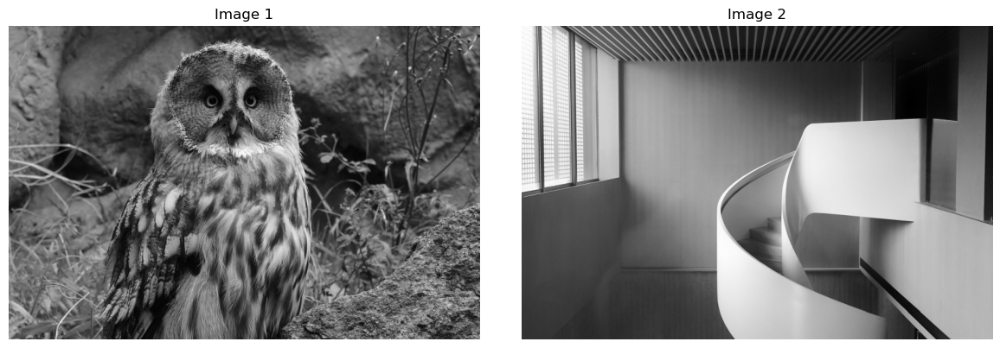

In [30]:
# Question 1

# TODO: Load the images as grayscale
exp_image1 = color.rgb2gray(io.imread('C:/Users/ompal/Desktop/meet3/images/8/exp1.png'))
exp_image2 = color.rgb2gray(io.imread('C:/Users/ompal/Desktop/meet3/images/8/exp2.png'))

exp_image1 = util.img_as_ubyte(exp_image1)
exp_image2 = util.img_as_ubyte(exp_image2)

# Show the images
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.imshow(exp_image1, cmap="gray")
plt.title("Image 1")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(exp_image2, cmap="gray")
plt.title("Image 2")
plt.axis('off')

plt.tight_layout()
plt.show()


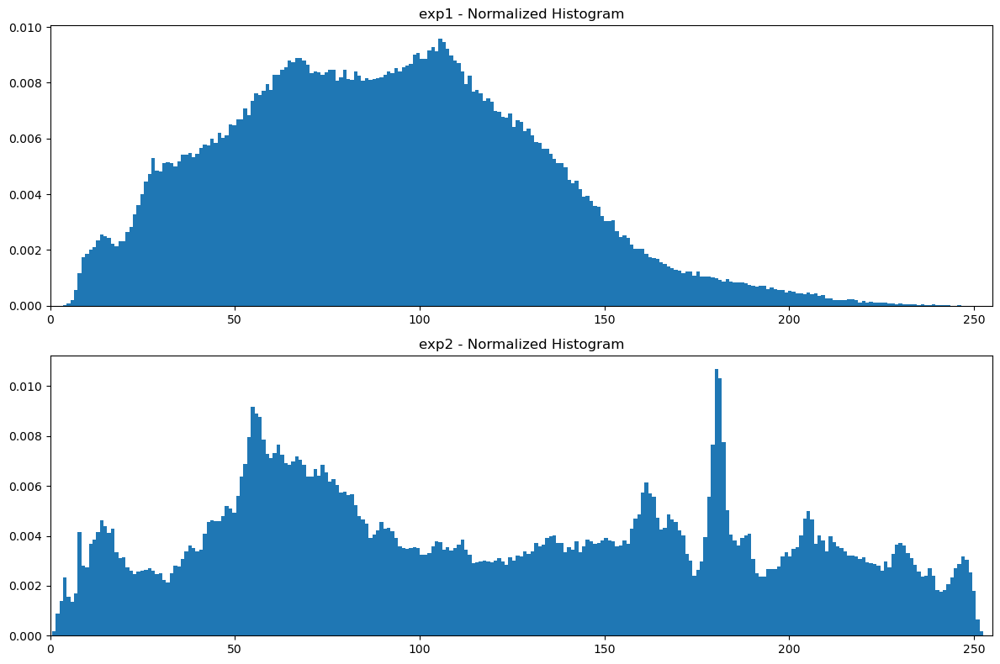

In [31]:
# Question 2

# Calculate and show normalized image histograms
plt.figure(figsize=(12,8))

plt.subplot(2,1,1)
hist_counts1, bin_edges1 = np.histogram(exp_image1.flatten(), bins=256, range=(0, 255), density=False)
hist_counts1 = hist_counts1 / hist_counts1.sum()
plt.bar(bin_edges1[:-1], hist_counts1, width=1)
plt.xlim(0,255)
plt.title("exp1 - Normalized Histogram")

plt.subplot(2,1,2)
hist_counts2, bin_edges2 = np.histogram(exp_image2.flatten(), bins=256, range=(0, 255), density=False)
hist_counts2 = hist_counts2 / hist_counts2.sum()
plt.bar(bin_edges2[:-1], hist_counts2, width=1)
plt.xlim(0,255)
plt.title("exp2 - Normalized Histogram")

plt.tight_layout()
plt.show()


In [32]:
# Question 3

# TODO: Calculate image entropies using the 'measure.shannon_entropy' function
entropy1 = measure.shannon_entropy(exp_image1)
entropy2 = measure.shannon_entropy(exp_image2)

print(f"exp1 entropy: {round(entropy1, 2)}")
print(f"exp2 entropy: {round(entropy2, 2)}")


exp1 entropy: 7.37
exp2 entropy: 7.87


In [33]:
# Question 4

# TODO: Calculate uncompressed image sizes in bits
image1_uncompressed_size = exp_image1.size * 8
image2_uncompressed_size = exp_image2.size * 8

# Print uncompressed image sizes
print(f"exp1 uncompressed size [bits]: {image1_uncompressed_size}")
print(f"exp2 uncompressed size [bits]: {image2_uncompressed_size}")


exp1 uncompressed size [bits]: 3145728
exp2 uncompressed size [bits]: 3145728


# Assignment 2 - Entropy Coding

In [34]:
# Question 1

def huffman_encode(data):
    """
    Performs Huffman coding on the input data.

    Args:
        data (1D np.ndarray): The input data to be encoded.

    Returns:
        A tuple containing the encoded data and the codebook.
            1D np.ndarray of the encoded data.
            dict of a codebook mapping pixel values to their Huffman codes.
    """

    # Create Huffman coder from symbol frequencies
    pixel_freqs = Counter(data)
    coder = HuffmanCodec.from_frequencies(pixel_freqs)

    # TODO: Encode the data and get the codebook using coder's
    #       'encode' and 'get_code_table' functions
    code = coder.encode(list(data))
    codebook = coder.get_code_table()

    return code, codebook


def huffman_decode(code, codebook):
    """
    Performs Huffman decoding on the input code using the provided codebook.

    Args:
        code (1D np.ndarray): The encoded data to be decoded.
        codebook (dict): The codebook used for encoding.

    Returns:
        1D np.ndarray of the decoded data.
    """
    # Create a Huffman coder from the codebook
    coder = HuffmanCodec(code_table=codebook)

    # Decode the code using the coder
    data = coder.decode(code)

    try:
        eof_index = data.index(np.pi)
        data = data[:eof_index]
    except ValueError:
        pass

    return np.array(data)


In [35]:
# Question 2

# TODO: Perfom Huffman coding and decoding on exp_image1 or exp_image2
#       Don't forget to 'flatten' the image before encoding and to 'reshape' back
#       after decoding
img = exp_image1
H, W = img.shape # Height and Width
code, codebook = huffman_encode(img.flatten())
decoded = huffman_decode(code, codebook)
recon = np.asanyarray(decoded, dtype=img.dtype).reshape(H, W)
# TODO: Compare the original and the reconstructed image using PSNR and SSIM
huffman_psnr = peak_signal_noise_ratio(img, recon, data_range=255)
huffman_ssim = structural_similarity(img, recon, data_range=255)

print("Huffman coding results:")
print(f"PSNR: {huffman_psnr:.2f}")
print(f"SSIM: {huffman_ssim:.2f}")


Huffman coding results:
PSNR: inf
SSIM: 1.00


c:\Users\ompal\anaconda3\envs\ip_lab\Lib\site-packages\skimage\metrics\simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


In [36]:
# Question 3

def compression_ratio(image, code, codebook, include_codebook=True):
    """
    Computes the compression ratio of an image.

    Args:
        image (np.ndarray): The original uncompressed image.
        code (np.ndarray): The encoded image as a string of bits.
        codebook (dict): The codebook used for encoding. Required if include_codebook
            is True.
        include_codebook (bool,options): Whether to include the codebook size in the
            calculation. Defaults to True.

    Returns:
        A float of the compression ratio of the image.
    """

    # TODO: Calculate the image size in bits
    image_size = int(img.size) * 8

    # TODO: Calculate the code size in bits
    code_size = len(code) * 8

    encoded_size = code_size
    if include_codebook:
        # Calculate the the codebook size in bits
        codebook_keys_size = sum(8 for _ in codebook)
        codebook_values_size = sum(len(c) for c in codebook.values())
        codebook_size = codebook_keys_size + codebook_values_size
        encoded_size += codebook_size

    return image_size / encoded_size


# TODO: Perform Huffman encoding on one of the images
code, codebook = huffman_encode(exp_image1.flatten())

# TODO: Calculate the code size in bits
code_size = len(code) * 8
print(f"Image code size [bits]: {code_size}")

# TODO: Calculate the compression ratio without the codebook size
comp_ratio = compression_ratio(exp_image1, code, codebook, include_codebook=False)
print(f"Image compression ratio without codebook size: {comp_ratio:.2f}")


Image code size [bits]: 2907424
Image compression ratio without codebook size: 1.08


In [37]:
# Question 4

# Calculate the codebook size in bits
codebook_keys_size = sum(8 for _ in codebook)
codebook_values_size = sum(len(code) for code in codebook.values())
codebook_size = codebook_keys_size + codebook_values_size
print(f"Codebook size [bits]: {codebook_size}")

# TODO: Calculate the compression ratio with the codebook size
comp_ratio = compression_ratio(exp_image1, code, codebook, include_codebook=True)
print(f"Image compression ratio with codebook size: {comp_ratio:.2f}")


Codebook size [bits]: 2490
Image compression ratio with codebook size: 1.08


In [39]:
# Question 5

filenames = ['C:/Users/ompal/Desktop/meet3/images/entropy/entropy1.png', 'C:/Users/ompal/Desktop/meet3/images/entropy/entropy2.png', 'C:/Users/ompal/Desktop/meet3/images/entropy/entropy3.png', 'C:/Users/ompal/Desktop/meet3/images/entropy/entropy4.png']   ########################

# TODO: Perform Huffman encoding on the four images (as grayscale uint8) and print the
#       compression ratios

for i, f in enumerate(filenames, start=1):                       ########################
    # 1) טוענים כ־grayscale uint8
    img = util.img_as_ubyte(io.imread(f, as_gray=True))
    H, W = img.shape

    # 2) מקודדים הופמן על הווקטור השטוח
    code, codebook = huffman_encode(img.flatten())

    # 3) חישוב גדלים בביטים
    orig_bits = H * W * 8                         # תמונה לא דחוסה
    code_bits = len(code) * 8                     # הקוד שחזר מ־encode (מחרוזת תווים)
    # גודל codebook: כל מפתח הוא בת 8 ביט (ערך פיקסל 0..255),
    # והערך הוא מחרוזת ביטים באורך len(v)
    cb_keys_bits   = 8 * len(codebook)
    cb_values_bits = sum(len(v) for v in codebook.values())
    cb_bits = cb_keys_bits + cb_values_bits

    # 4) יחסי דחיסה
    cr_wo_cb = orig_bits / code_bits
    cr_w_cb  = orig_bits / (code_bits + cb_bits)

    # 5) הדפסה מסודרת
    print(f"\nImage e{i}: {f}")
    print(f"  Original size [bits]: {orig_bits}")
    print(f"  Code size     [bits]: {code_bits}")
    print(f"  Codebook size [bits]: {cb_bits}")
    print(f"  Compression ratio (no codebook): {cr_wo_cb:.2f}")
    print(f"  Compression ratio (with codebook): {cr_w_cb:.2f}")   ##########################


Image e1: C:/Users/ompal/Desktop/meet3/images/entropy/entropy1.png
  Original size [bits]: 3145728
  Code size     [bits]: 3095576
  Codebook size [bits]: 2570
  Compression ratio (no codebook): 1.02
  Compression ratio (with codebook): 1.02

Image e2: C:/Users/ompal/Desktop/meet3/images/entropy/entropy2.png
  Original size [bits]: 3145728
  Code size     [bits]: 1824944
  Codebook size [bits]: 1770
  Compression ratio (no codebook): 1.72
  Compression ratio (with codebook): 1.72

Image e3: C:/Users/ompal/Desktop/meet3/images/entropy/entropy3.png
  Original size [bits]: 3145728
  Code size     [bits]: 2293128
  Codebook size [bits]: 2570
  Compression ratio (no codebook): 1.37
  Compression ratio (with codebook): 1.37

Image e4: C:/Users/ompal/Desktop/meet3/images/entropy/entropy4.png
  Original size [bits]: 3145728
  Code size     [bits]: 2528384
  Codebook size [bits]: 2220
  Compression ratio (no codebook): 1.24
  Compression ratio (with codebook): 1.24


# Assignment 3 - Grayscale Image Compression 

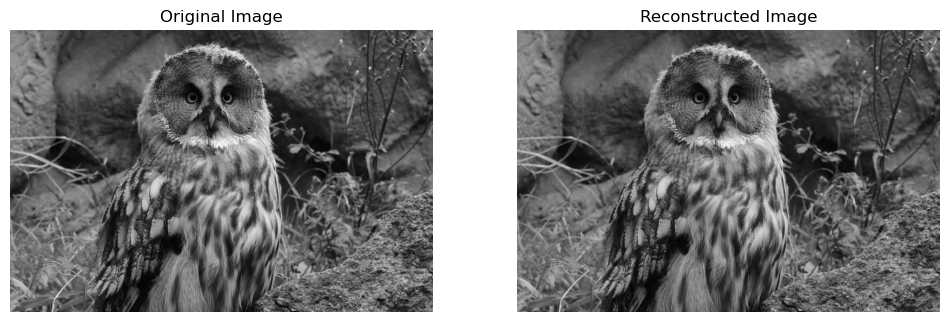

In [40]:
# Question 1

def image_encode(image, qtype='psyvisual', qf=1.0):
    """
    Encodes an input single channel image using block-based DCT, quantization, zigzag
    scanning, and Huffman coding.

    Args:
        image (np.ndarray): The input image.
        qtype (str, optional): The quantization matrix type -
            'uniform', 'psyvisual' (defualt) or 'chroma'.
        qf (float, optional): The quantization factor. Defaults to 1.0
    Returns:
        A tuple containing:
            np.ndarray of the encoded image
            dict of the Huffman codebook
    """

    block_size = 8
    qmatrices = loadmat("lab_code/quantization_matrices.mat")
    qmatrix = qmatrices[qtype].astype(float)

    # TODO: Perform DCT and quantization for each block using the 'block_process'
    #       function
    dct_quantize_handle = dct_quantize
    dct_image = block_process(image, (block_size, block_size), dct_quantize_handle, qmatrix, qf)  ###########

    # Zigzag scan for each DCT block
    zigzag_handle = zigzag
    dct_coeffs = block_process(dct_image, (block_size, block_size), zigzag_handle)

    # Concatenate the zigzag-scanned blocks into a single vector
    dct_coeffs_matrix = np.hstack(np.vsplit(dct_coeffs, dct_coeffs.shape[0] // block_size**2))

    # Concatenate the non-zero elements of each column with a delimiter of 0.5.
    dct_coeffs_vector = np.array([])
    for column_index in range(dct_coeffs_matrix.shape[1]):
        # Remove trailing zeros from the column
        trimmed_column = np.trim_zeros(dct_coeffs_matrix[:, column_index], 'b')

        # TODO: Append the trimmed column to the end of vector, then append 0.5
        dct_coeffs_vector = np.append(np.append(dct_coeffs_vector, trimmed_column), 0.5)  ###########

    # TODO: Huffman encode the DCT coefficients
    code, codebook = huffman_encode(dct_coeffs_vector)

    return code, codebook


def image_decode(code, codebook, image_shape, qtype='psyvisual', qf=1.0):
    """
    Decodes the given Huffman-encoded code and reconstructs the single channel image
    using inverse zigzag scanning, dequantization and block-based inverse DCT.

    Args:
        code (np.ndarray): The Huffman-encoded code.
        codebook (dict): The Huffman codebook used for encoding.
        image_shape (tuple): The shape of the original image.
        qtype (str, optional): The quantization matrix type -
            'uniform', 'psyvisual' (default) or 'chroma'.
        qf (float, optional): The quantization factor. Defaults to 1.0.

    Returns:
        np.ndarray of the reconstructed image.
    """
    block_size = 8

    # Decode the Huffman-encoded code
    decoded_vector = huffman_decode(code, codebook)

    # Initialize an empty matrix to store the DCT coefficients
    dct_coefficients = np.zeros((block_size**2, image_shape[0] * image_shape[1] // (block_size**2)))

    index = 0
    block_index = 0
    for i in range(len(decoded_vector)):
        if decoded_vector[i] == np.pi:
            break
        if decoded_vector[i] != 0.5:
            continue

        current_coeffs = decoded_vector[index:i]
        current_coeffs_padded = np.pad(current_coeffs, (0,(block_size**2) - len(current_coeffs)), mode="constant", constant_values=0)
        dct_coefficients[:, block_index] = current_coeffs_padded.reshape(block_size**2)

        block_index += 1
        index = i + 1

    dct_coeffs_matrix  = np.vstack(np.hsplit(dct_coefficients, image_shape[0] // block_size))
    dct_image = block_process(dct_coeffs_matrix, (block_size**2,1), izigzag, (block_size,block_size))

    # Load quantization matrix
    qmatrices = loadmat("lab_code/quantization_matrices.mat")
    qmatrix = qmatrices[qtype].astype(float)

    # Perform deuqantization and inverse DCT for each block
    reconstructed_image = block_process(dct_image, (block_size,block_size), dequantize_idct, qmatrix, qf)
    reconstructed_image = np.clip(reconstructed_image, 0, 255)

    return reconstructed_image.astype(np.uint8)


# TODO: Check 'image_encode' by encdoing one of the images and then decoding it using
#       the 'image_decode' function
exp_image = exp_image1   ############ 
reconstructed_exp_image = image_decode(*image_encode(exp_image, 'psyvisual', 1.0), exp_image.shape, 'psyvisual', 1.0)   ###########

# Display original and reconstructed images
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.imshow(exp_image, cmap="gray")
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(reconstructed_exp_image, cmap="gray")
plt.title("Reconstructed Image")
plt.axis('off')
plt.show()


QF=1
 exp1 -> CR=7.06, PSNR=32.22, SSIM=0.945
 exp2 -> CR=14.41, PSNR=37.81, SSIM=0.966
--------------------------------------------------
QF=2
 exp1 -> CR=10.93, PSNR=30.00, SSIM=0.906
 exp2 -> CR=20.65, PSNR=35.10, SSIM=0.942
--------------------------------------------------
QF=4
 exp1 -> CR=17.58, PSNR=27.84, SSIM=0.839
 exp2 -> CR=29.66, PSNR=32.34, SSIM=0.901
--------------------------------------------------
QF=8
 exp1 -> CR=30.73, PSNR=25.41, SSIM=0.725
 exp2 -> CR=43.50, PSNR=29.15, SSIM=0.841
--------------------------------------------------


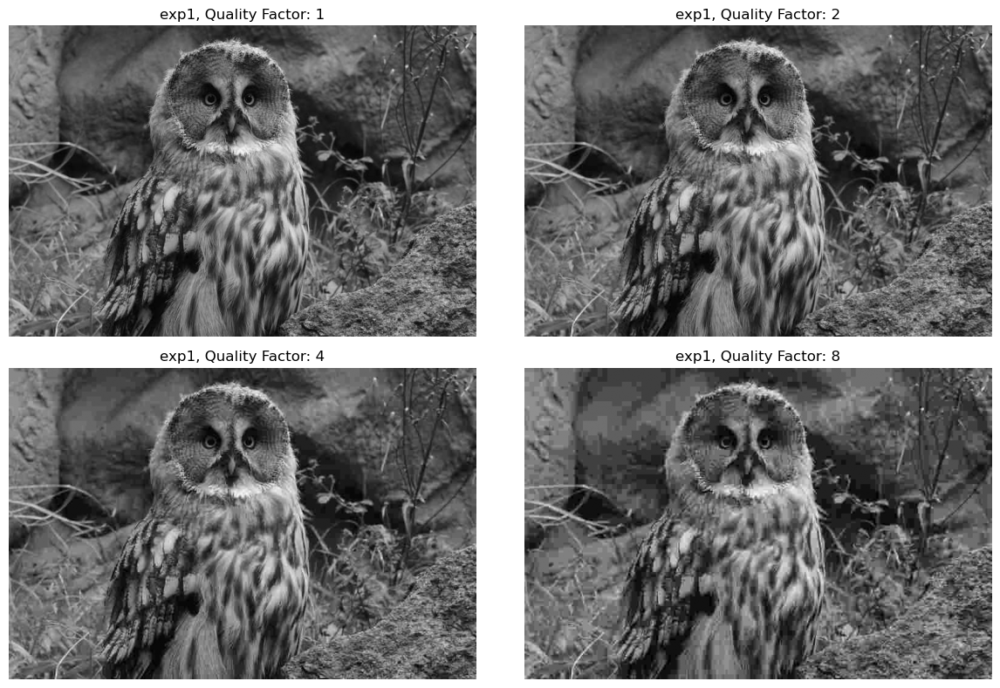

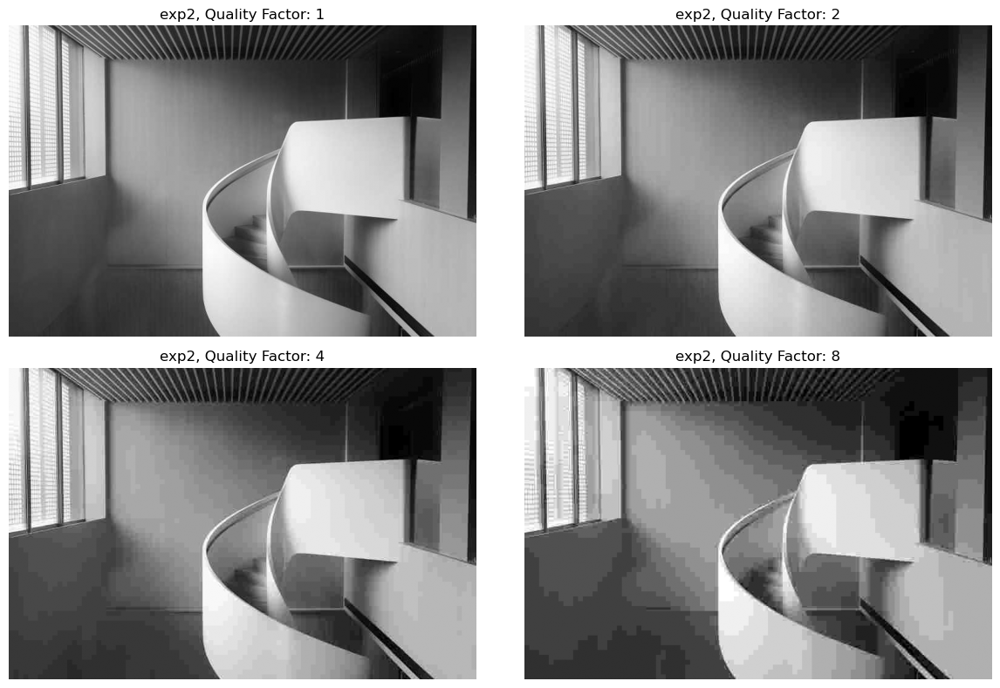

In [41]:
# Question 2

quality_factors = [1, 2, 4, 8]
reconstructed_images1 = []
reconstructed_images2 = []
compression_ratios1 = []
compression_ratios2 = []
psnr_values1 = []
psnr_values2 = []
ssim_values1 = []
ssim_values2 = []

# TODO: Encode exp_image1 & exp_image2 using 'image_encode' with qf of 1, 2, 4, 8
#       Compute the compression ratio, PSNR and SSIM for the 8 images
for qf in quality_factors:                                                               ################
     # exp1
    code1, book1 = image_encode(exp_image1, qtype='psyvisual', qf=qf)
    rec1 = image_decode(code1, book1, exp_image1.shape, qtype='psyvisual', qf=qf)
    reconstructed_images1.append(rec1)
    cb1_size = sum(8 for _ in book1) + sum(len(c) for c in book1.values())
    compression_ratios1.append((exp_image1.size * 8) / (len(code1) * 8 + cb1_size))
    psnr1 = peak_signal_noise_ratio(exp_image1, rec1, data_range=255)
    ssim1 = structural_similarity(exp_image1, rec1, data_range=255)
    psnr_values1.append(psnr1)
    ssim_values1.append(ssim1)

    # exp2
    code2, book2 = image_encode(exp_image2, qtype='psyvisual', qf=qf)
    rec2 = image_decode(code2, book2, exp_image2.shape, qtype='psyvisual', qf=qf)
    reconstructed_images2.append(rec2)
    cb2_size = sum(8 for _ in book2) + sum(len(c) for c in book2.values())
    compression_ratios2.append((exp_image2.size * 8) / (len(code2) * 8 + cb2_size))
    psnr2 = peak_signal_noise_ratio(exp_image2, rec2, data_range=255)
    ssim2 = structural_similarity(exp_image2, rec2, data_range=255)
    psnr_values2.append(psnr2)
    ssim_values2.append(ssim2)        

    print(f"QF={qf}")
    print(f" exp1 -> CR={compression_ratios1[-1]:.2f}, PSNR={psnr1:.2f}, SSIM={ssim1:.3f}")
    print(f" exp2 -> CR={compression_ratios2[-1]:.2f}, PSNR={psnr2:.2f}, SSIM={ssim2:.3f}")
    print("-" * 50)                     #################


# Show the 8 reconstructed images
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for i, ax in enumerate(axes.flat):
    ax.imshow(reconstructed_images1[i], cmap='gray')
    ax.set_title(f'exp1, Quality Factor: {quality_factors[i]}')
    ax.axis('off')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for i, ax in enumerate(axes.flat):
    ax.imshow(reconstructed_images2[i], cmap='gray')
    ax.set_title(f'exp2, Quality Factor: {quality_factors[i]}')
    ax.axis('off')
plt.tight_layout()
plt.show()


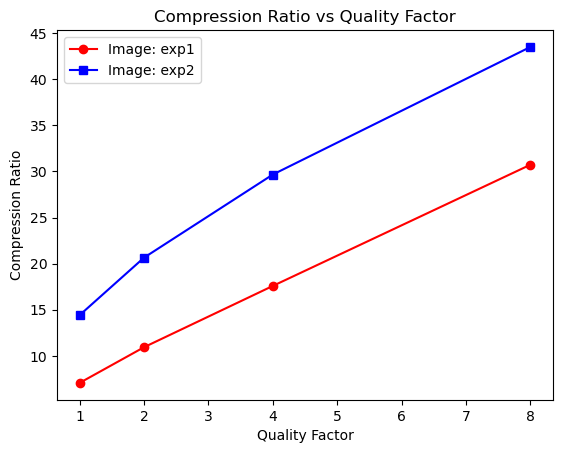

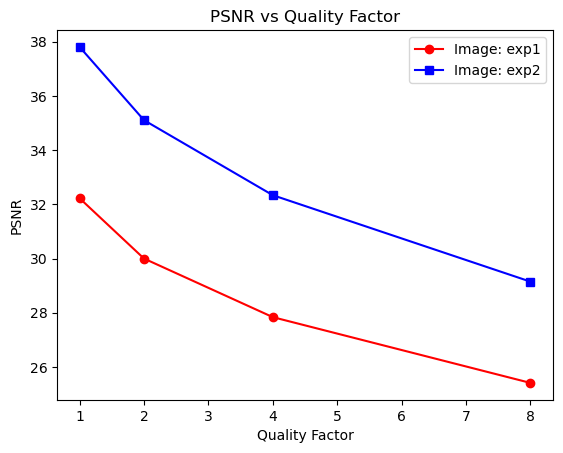

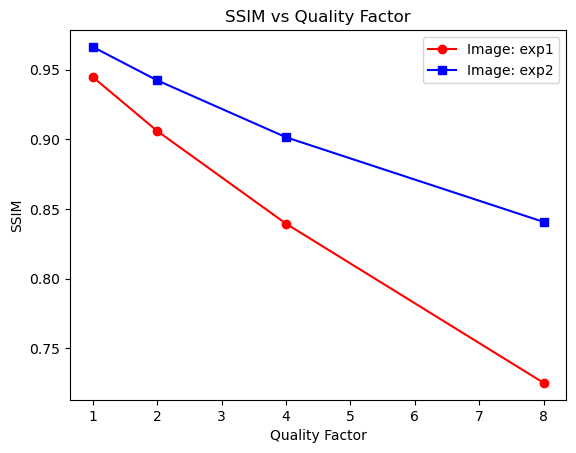

In [42]:
# Question 4

# Show compression ratio vs. qf
fig, ax = plt.subplots()
ax.plot(quality_factors, compression_ratios1, label='Image: exp1', marker='o', color='r')
ax.plot(quality_factors, compression_ratios2, label='Image: exp2', marker='s', color='b')
ax.set_xlabel('Quality Factor')
ax.set_ylabel('Compression Ratio')
ax.set_title('Compression Ratio vs Quality Factor')
ax.legend()
plt.show()

# Show PSNR vs. qf
fig, ax = plt.subplots()
ax.plot(quality_factors, psnr_values1, label='Image: exp1', marker='o', color='r')
ax.plot(quality_factors, psnr_values2, label='Image: exp2', marker='s', color='b')
ax.set_xlabel('Quality Factor')
ax.set_ylabel('PSNR')
ax.set_title('PSNR vs Quality Factor')
ax.legend()
plt.show()

# Show SSIM vs. qf
fig, ax = plt.subplots()
ax.plot(quality_factors, ssim_values1, label='Image: exp1', marker='o', color='r')
ax.plot(quality_factors, ssim_values2, label='Image: exp2', marker='s', color='b')
ax.set_xlabel('Quality Factor')
ax.set_ylabel('SSIM')
ax.set_title('SSIM vs Quality Factor')
ax.legend()
plt.show()


[VIS] qf=4  Compression ratio: 36.98
[THERMAL] qf=4  Compression ratio: 41.15


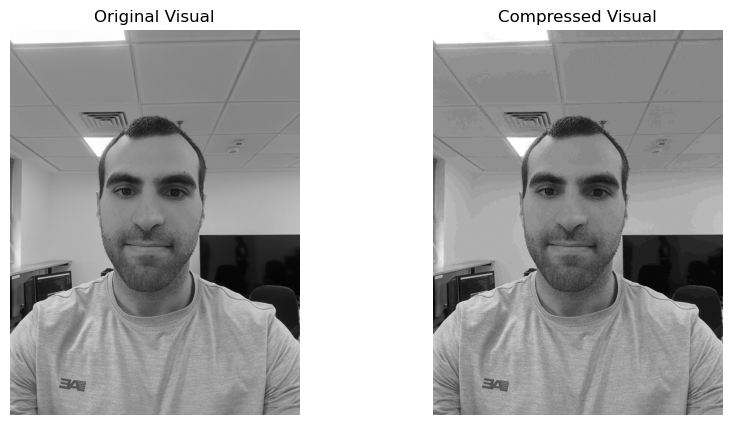

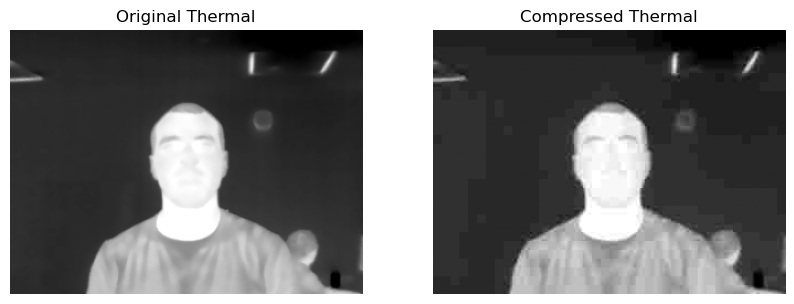

In [43]:
# Question 6

# TODO: Encode a visual image you took in the first meeting and print the compression
#       ratio. Don't forget to use the 'visual_prep' function
        
qf = 4                                    ###############################
# --- Visual image ---
vis_u8 = visual_prep('C:/Users/ompal/Desktop/meet3/images/8/face.jpg')
H, W = vis_u8.shape; vis_u8 = vis_u8[:H - (H % 8) or H, :W - (W % 8) or W]   
code_v, book_v = image_encode(vis_u8, qtype="psyvisual", qf=qf)

# גודל מקורי וספר הקודים (בביטים)
orig_bits_v   = vis_u8.size * 8
code_bits_v   = len(code_v) * 8
codebook_bits_v = sum(8 for _ in book_v) + sum(len(c) for c in book_v.values())

cr_vis = orig_bits_v / (code_bits_v + codebook_bits_v)
print(f"[VIS] qf={qf}  Compression ratio: {cr_vis:.2f}")
# TODO: Encode a thermal image of the same scene you took in the first meeting and print
#       the compression ratio. Don't forget to use the to 'thermal_prep_uint8' function

# --- Thermal image ---
thm_u8 = thermal_prep_uint8('C:/Users/ompal/Desktop/meet3/images/8/face_thermal.jpg')
H, W = thm_u8.shape; thm_u8 = thm_u8[:H - (H % 8) or H, :W - (W % 8) or W]   
code_t, book_t = image_encode(thm_u8, qtype="psyvisual", qf=qf)

orig_bits_t   = thm_u8.size * 8
code_bits_t   = len(code_t) * 8
codebook_bits_t = sum(8 for _ in book_t) + sum(len(c) for c in book_t.values())

cr_thm = orig_bits_t / (code_bits_t + codebook_bits_t)
print(f"[THERMAL] qf={qf}  Compression ratio: {cr_thm:.2f}")

# --- Show original and reconstructed images ---

# Visual image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(vis_u8, cmap="gray")
plt.title("Original Visual")
plt.axis("off")

plt.subplot(1, 2, 2)
rec_vis = image_decode(code_v, book_v, vis_u8.shape, qtype="psyvisual", qf=qf)
plt.imshow(rec_vis, cmap="gray")
plt.title("Compressed Visual")
plt.axis("off")
plt.show()

# Thermal image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(thm_u8, cmap="gray")
plt.title("Original Thermal")
plt.axis("off")

plt.subplot(1, 2, 2)
rec_thm = image_decode(code_t, book_t, thm_u8.shape, qtype="psyvisual", qf=qf)
plt.imshow(rec_thm, cmap="gray")
plt.title("Compressed Thermal")
plt.axis("off")
plt.show()                                        #############################

# Assignment 4 - Color Image Compression

max |diff|: 40
PSNR [dB]: 37.485673675408144


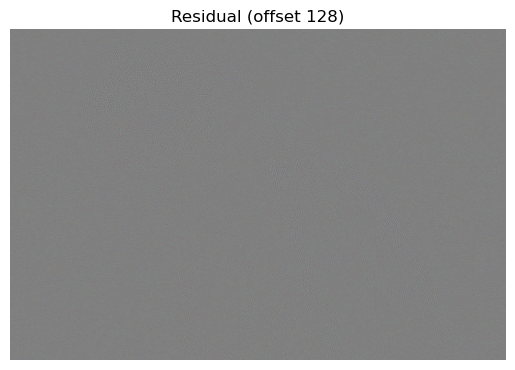

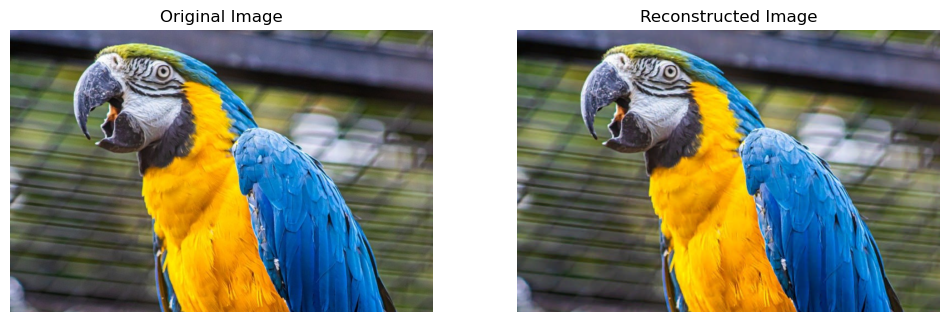

In [48]:
# Questions 1, 4, 5

def color_image_encode(image, qf=1.0, colorspace='RGB'):
    """
    Encodes an input 3-channel image using block-based DCT, quantization, zigzag
    scanning, and Huffman coding.

    Args:
        image (np.ndarray): The input image.
        qf (float, optional): The quantization factor. Defaults to 1.0.
        colorspace (str, optional): The color space for encoding -
            'RGB' (default), 'YCbCr444', or 'YCbCr420'.

    Returns:
        A tuple containing:
            np.ndarray of the encoded image.
            list of indices for separating the encoded data into channels.
            list of dicts that are Huffman codebooks, one for each channel.
    """

    qtype_channel0 = qtype_channel1 = qtype_channel2 = 'psyvisual'

    H, W = image.shape[:2]

    if colorspace == 'RGB':
        # פירוק קלאסי ל-R,G,B
        channel0 = image[:, :, 0].astype(np.uint8)
        channel1 = image[:, :, 1].astype(np.uint8)
        channel2 = image[:, :, 2].astype(np.uint8)

    elif colorspace == 'YCbCr444':
        # המרה ל-YCbCr ושמירה ברזולוציית 4:4:4 (ללא דגימה תת-כרומטית)
        ycbcr = color.rgb2ycbcr(image.astype(np.float64) / 255.0)
        ycbcr = np.clip(ycbcr, 0, 255).round().astype(np.uint8)
        channel0 = ycbcr[:, :, 0]  # Y (luma)
        channel1 = ycbcr[:, :, 1]  # Cb
        channel2 = ycbcr[:, :, 2]  # Cr
        qtype_channel1 = qtype_channel2 = 'chroma'  # מטריצות כימות לכרומה

    elif colorspace == 'YCbCr420':
        # המרה ל-YCbCr ודגימה תת-כרומטית 4:2:0 (חצי גובה/רוחב ל-Cb/Cr)
        ycbcr = color.rgb2ycbcr(image.astype(np.float64) / 255.0)
        ycbcr = np.clip(ycbcr, 0, 255).round().astype(np.uint8)
        channel0 = ycbcr[:, :, 0]

        channel1 = transform.resize(
            ycbcr[:, :, 1].astype(np.float64), (H // 2, W // 2),
            anti_aliasing=True, preserve_range=True
        ).round().astype(np.uint8)
        channel2 = transform.resize(
            ycbcr[:, :, 2].astype(np.float64), (H // 2, W // 2),
            anti_aliasing=True, preserve_range=True
        ).round().astype(np.uint8)

        qtype_channel1 = qtype_channel2 = 'chroma'

    else:
        raise ValueError(f"Unsupported colorspace '{colorspace}'. Use 'RGB', 'YCbCr444', or 'YCbCr420'.")

    # --- קידוד כל ערוץ בנפרד ---
    c0_code, c0_book = image_encode(channel0, qtype_channel0, qf)
    c1_code, c1_book = image_encode(channel1, qtype_channel1, qf)
    c2_code, c2_book = image_encode(channel2, qtype_channel2, qf)

    # הבטחת סוג/ממדים לשרשור
    def _to_uint8_1d(x):
        if isinstance(x, (bytes, bytearray, np.bytes_)):
            arr = np.frombuffer(bytes(x), dtype=np.uint8)
        else:
            arr = np.asarray(x, dtype=np.uint8).ravel()
        return arr

    c0_code = _to_uint8_1d(c0_code)
    c1_code = _to_uint8_1d(c1_code)
    c2_code = _to_uint8_1d(c2_code)

    # שרשור שלושת זרמי הקידוד
    code = np.concatenate([c0_code, c1_code, c2_code]).astype(np.uint8)

    # ספרי קוד לכל ערוץ + אינדקסי הפרדה
    codebooks = [c0_book, c1_book, c2_book]
    separation_indices = [len(c0_code), len(c0_code) + len(c1_code)]

    return code, separation_indices, codebooks


def color_image_decode(code, separation_indices, codebooks, image_shape, qf=1.0, colorspace='RGB'):
    """
    Decodes the given Huffman-encoded code and reconstructs the 3-channel image using
    inverse zigzag scanning, dequantization and block-based inverse DCT.

    Args:
        code (np.ndarray): The Huffman-encoded code.
        separation_indices (list): Indices separating the three channels in the code.
        codebooks (list of dicts): The Huffman codebooks for decoding each channel.
        image_shape (tuple): The Shape of the original image.
        qf (float, optional): The quantization factor. Defaults to 1.0.
        colorspace (str, optional): The color space for encoding -
            'RGB' (default), 'YCbCr444', or 'YCbCr420'.

    Returns:
        np.ndarray of the reconstructed color image.
    """

    # Create an empty array to store the reconstructed image
    reconstructed_image = np.empty((image_shape[0], image_shape[1], 3))

    channel0_shape = channel1_shape = channel2_shape = image_shape
    qtype_channel0 = qtype_channel1 = qtype_channel2 = 'psyvisual'

    # For YCbCr chroma channels, use chroma quantization matrix
    if colorspace in ['YCbCr444', 'YCbCr420']:
        qtype_channel1 = qtype_channel2 = 'chroma'

        # For YCbCr420 colorspac, modify chroma channel shapes
        if colorspace == 'YCbCr420':
            channel1_shape = channel2_shape = (image_shape[0] // 2, image_shape[1] // 2)

    # Decode the three channels
    reconstructed_channel0 = image_decode(code[:separation_indices[0]], codebooks[0], channel0_shape, qtype_channel0, qf)
    reconstructed_channel1 = image_decode(code[separation_indices[0]:separation_indices[1]], codebooks[1], channel1_shape, qtype_channel1, qf)
    reconstructed_channel2 = image_decode(code[separation_indices[1]:], codebooks[2], channel2_shape, qtype_channel2, qf)

    # For YCbCr420 colorspace, resize the chroma channels
    if colorspace == 'YCbCr420':
       reconstructed_channel1 = reconstructed_channel1.astype(np.float64)
       reconstructed_channel2 = reconstructed_channel2.astype(np.float64)
       reconstructed_channel1 = transform.resize(reconstructed_channel1, (reconstructed_channel1.shape[0] * 2,reconstructed_channel1.shape[1] * 2), anti_aliasing=True)
       reconstructed_channel2 = transform.resize(reconstructed_channel2, (reconstructed_channel2.shape[0] * 2,reconstructed_channel2.shape[1] * 2), anti_aliasing=True)
       reconstructed_channel1 = reconstructed_channel1.round().astype(np.uint8)
       reconstructed_channel2 = reconstructed_channel2.round().astype(np.uint8)

    # Assign the reconstructed channels to the respective channels in the output image
    reconstructed_image[:,:,0] = reconstructed_channel0
    reconstructed_image[:,:,1] = reconstructed_channel1
    reconstructed_image[:,:,2] = reconstructed_channel2

     # If YCbCr, convert to RGB
    if colorspace in ['YCbCr444', 'YCbCr420']:
        reconstructed_image = color.ycbcr2rgb(reconstructed_image)
        reconstructed_image = np.clip(reconstructed_image, 0, 1) # clip to remove negative values
        reconstructed_image = reconstructed_image * 255

    return reconstructed_image.round().astype(np.uint8)


# TODO: Check the 'color_image_encode' function by encdoing one of the images expc1 or
#       expc2 and then decoding it using the 'color_image_decode' function
expc_image =  io.imread('C:/Users/ompal/Desktop/meet3/images/8/expc1.png')
code, separation_indices, codebooks = color_image_encode(expc_image, qf=1.0, colorspace='RGB')
reconstructed_expc_image = color_image_decode(code, separation_indices, codebooks, expc_image.shape, qf=1.0, colorspace='RGB')   ###########

diff = expc_image.astype(np.int16) - reconstructed_expc_image.astype(np.int16)
print("max |diff|:", np.abs(diff).max())

mse = np.mean((expc_image.astype(np.float64) - reconstructed_expc_image.astype(np.float64))**2)
psnr = float("inf") if mse==0 else 10*np.log10((255**2)/mse)
print("PSNR [dB]:", psnr)

plt.figure(); plt.imshow(np.clip(diff + 128, 0, 255).astype(np.uint8)); plt.title("Residual (offset 128)"); plt.axis('off');

# Show the original and reconstructed images
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.imshow(expc_image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(reconstructed_expc_image)
plt.title("Reconstructed Image")
plt.axis('off')
plt.show()

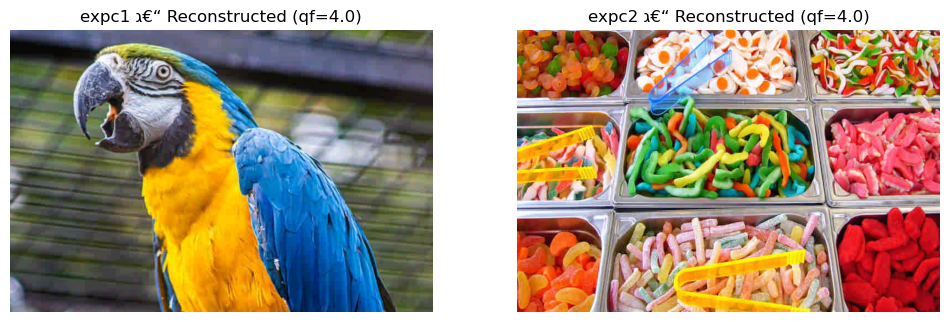

expc1:  CR=25.81x,  PSNR=31.95 dB,  SSIM=0.8681
expc2:  CR=14.01x,  PSNR=26.82 dB,  SSIM=0.8373


In [49]:
# Question 2
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

def color_compression_ratio(image, code, codebooks):
    """
    Computes the compression ratio of a color image.

    Args:
        image (np.ndarray): The original uncompressed image.
        code (str): The encoded image.
        codebook (list of dicts): A list of three codebooks used for encoding.

    Returns:
        float of the compression ratio of the image.
    """

    # TODO: Calculate the image size in bits
    image_size = image.size * 8

    # TODO: Calculate the code size in bits
    code_size = len(code) * 8

    # Calculate the the total codebook size in bits
    total_codebook_size = 0
    for codebook in codebooks:
        codebook_keys_size = sum(8 for _ in codebook)
        codebook_values_size = sum(len(c) for c in codebook.values())
        codebook_size = codebook_keys_size + codebook_values_size
        total_codebook_size += codebook_size

    encoded_size = code_size + total_codebook_size

    return image_size / encoded_size


# TODO: Encode expc1 and expc2 with 'qf=4.0'

img1 = io.imread('C:/Users/ompal/Desktop/meet3/images/8/expc1.png')

img2 = io.imread('C:/Users/ompal/Desktop/meet3/images/8/expc2.png')

qf_val = 4.0

# expc1
code1, sep1, books1 = color_image_encode(img1, qf=qf_val, colorspace='RGB')
rec1 = color_image_decode(code1, sep1, books1, img1.shape, qf=qf_val, colorspace='RGB')
cr1 = color_compression_ratio(img1, code1, books1)
psnr1 = psnr(img1, rec1, data_range=255)
ssim1 = ssim(img1, rec1, channel_axis=-1, data_range=255)

# expc2
code2, sep2, books2 = color_image_encode(img2, qf=qf_val, colorspace='RGB')
rec2 = color_image_decode(code2, sep2, books2, img2.shape, qf=qf_val, colorspace='RGB')
cr2 = color_compression_ratio(img2, code2, books2)
psnr2 = psnr(img2, rec2, data_range=255)
ssim2 = ssim(img2, rec2, channel_axis=-1, data_range=255)

# TODO: Show the two reconstructed images
plt.figure(figsize=(12,4))
plt.subplot(1,2,1); plt.imshow(rec1); plt.title("expc1 ג€“ Reconstructed (qf=4.0)"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(rec2); plt.title("expc2 ג€“ Reconstructed (qf=4.0)"); plt.axis('off')
plt.show()
# TODO: Print compression ratio for the two compressed images

# TODO: Print SSIM and PSNR for the the two recnstructed images
#       When computing SSIM for a color image, use 'channel_axis=-1'

print(f"expc1:  CR={cr1:.2f}x,  PSNR={psnr1:.2f} dB,  SSIM={ssim1:.4f}")
print(f"expc2:  CR={cr2:.2f}x,  PSNR={psnr2:.2f} dB,  SSIM={ssim2:.4f}")

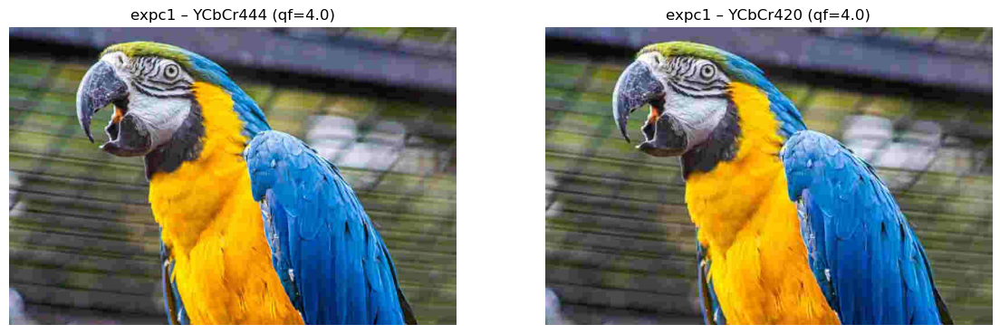

expc1 YCbCr444: CR=48.81x, PSNR=29.19 dB, SSIM=0.8045
expc1 YCbCr420: CR=69.21x, PSNR=28.28 dB, SSIM=0.8012


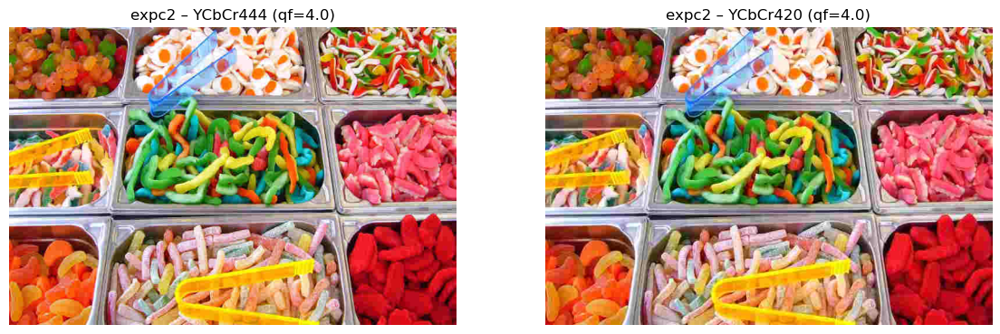

expc2 YCbCr444: CR=28.36x, PSNR=24.48 dB, SSIM=0.7570
expc2 YCbCr420: CR=38.89x, PSNR=23.34 dB, SSIM=0.7298


In [ ]:
# Question 6
qf_val = 4.0

# --- expc1 ---
expc1 = io.imread('C:/Users/ompal/Desktop/meet3/images/8/expc1.png')

# YCbCr444
code_444, sep_444, books_444 = color_image_encode(expc1, qf=qf_val, colorspace='YCbCr444')
rec_444 = color_image_decode(code_444, sep_444, books_444, expc1.shape, qf=qf_val, colorspace='YCbCr444')

# YCbCr420
code_420, sep_420, books_420 = color_image_encode(expc1, qf=qf_val, colorspace='YCbCr420')
rec_420 = color_image_decode(code_420, sep_420, books_420, expc1.shape, qf=qf_val, colorspace='YCbCr420')

# חישוב CR, PSNR, SSIM
cr_444 = color_compression_ratio(expc1, code_444, books_444)
psnr_444 = peak_signal_noise_ratio(expc1, rec_444, data_range=255)
ssim_444 = structural_similarity(expc1, rec_444, channel_axis=-1, data_range=255)

cr_420 = color_compression_ratio(expc1, code_420, books_420)
psnr_420 = peak_signal_noise_ratio(expc1, rec_420, data_range=255)
ssim_420 = structural_similarity(expc1, rec_420, channel_axis=-1, data_range=255)

# הצגת התוצאות
plt.figure(figsize=(14,6))
plt.subplot(1,2,1); plt.imshow(rec_444); plt.title(f"expc1 – YCbCr444 (qf={qf_val})"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(rec_420); plt.title(f"expc1 – YCbCr420 (qf={qf_val})"); plt.axis('off')
plt.show()

print(f"expc1 YCbCr444: CR={cr_444:.2f}x, PSNR={psnr_444:.2f} dB, SSIM={ssim_444:.4f}")
print(f"expc1 YCbCr420: CR={cr_420:.2f}x, PSNR={psnr_420:.2f} dB, SSIM={ssim_420:.4f}")


# --- expc2 ---
expc2 = io.imread('C:/Users/ompal/Desktop/meet3/images/8/expc2.png')

# YCbCr444
code_444, sep_444, books_444 = color_image_encode(expc2, qf=qf_val, colorspace='YCbCr444')
rec_444 = color_image_decode(code_444, sep_444, books_444, expc2.shape, qf=qf_val, colorspace='YCbCr444')

# YCbCr420
code_420, sep_420, books_420 = color_image_encode(expc2, qf=qf_val, colorspace='YCbCr420')
rec_420 = color_image_decode(code_420, sep_420, books_420, expc2.shape, qf=qf_val, colorspace='YCbCr420')

# חישוב CR, PSNR, SSIM
cr_444 = color_compression_ratio(expc2, code_444, books_444)
psnr_444 = peak_signal_noise_ratio(expc2, rec_444, data_range=255)
ssim_444 = structural_similarity(expc2, rec_444, channel_axis=-1, data_range=255)

cr_420 = color_compression_ratio(expc2, code_420, books_420)
psnr_420 = peak_signal_noise_ratio(expc2, rec_420, data_range=255)
ssim_420 = structural_similarity(expc2, rec_420, channel_axis=-1, data_range=255)

# הצגת התוצאות
plt.figure(figsize=(14,6))
plt.subplot(1,2,1); plt.imshow(rec_444); plt.title(f"expc2 – YCbCr444 (qf={qf_val})"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(rec_420); plt.title(f"expc2 – YCbCr420 (qf={qf_val})"); plt.axis('off')
plt.show()

print(f"expc2 YCbCr444: CR={cr_444:.2f}x, PSNR={psnr_444:.2f} dB, SSIM={ssim_444:.4f}")
print(f"expc2 YCbCr420: CR={cr_420:.2f}x, PSNR={psnr_420:.2f} dB, SSIM={ssim_420:.4f}")


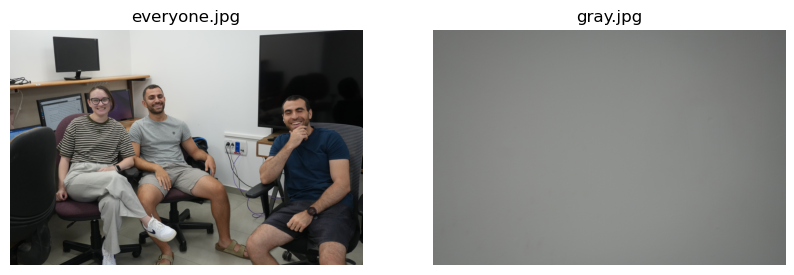

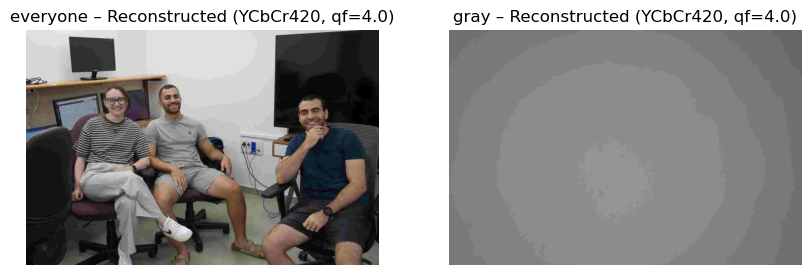

everyone.jpg  – Compression Ratio: 91.02x
gray.jpg      – Compression Ratio: 273.63x


In [ ]:
# Question 9

# TODO: Show two visual images you took
#       Don't forget to use the 'visual_prep' function with the parameter
#       'convert_to_grayscale=False'

# TODO Encode the two images using the 'color_image_encode' function

# TODO Compute the two compression ratios using the 'color_compression_ratio'
#      function and print them



def pad_to_multiple(img, m):
    """Pad image on bottom/right to multiples of m using edge padding."""
    import numpy as np
    h, w = img.shape[:2]
    nh = ((h + m - 1) // m) * m
    nw = ((w + m - 1) // m) * m
    if nh == h and nw == w:
        return img, (h, w)
    pad_h = nh - h
    pad_w = nw - w
    # pad: (top,bottom), (left,right), (channels=0)
    img_padded = np.pad(img, ((0, pad_h), (0, pad_w), (0, 0)), mode='edge')
    return img_padded, (h, w)

def encode_decode_with_padding(img, qf, colorspace):
    """Pad as needed, encode/decode, then crop back to original size."""
    import numpy as np
    m = 16 if colorspace == 'YCbCr420' else 8
    img_pad, orig_hw = pad_to_multiple(img, m)
    code, sep, books = color_image_encode(img_pad, qf=qf, colorspace=colorspace)
    rec_pad = color_image_decode(code, sep, books, img_pad.shape, qf=qf, colorspace=colorspace)
    h, w = orig_hw
    rec = rec_pad[:h, :w, :]
    return code, sep, books, rec

# --- load photos ---
img1 = visual_prep('C:/Users/ompal/Desktop/meet3/images/8/everyone.JPG', convert_to_grayscale=False)
img2 = visual_prep('C:/Users/ompal/Desktop/meet3/images/8/gray.JPG',     convert_to_grayscale=False)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(img1); plt.title("everyone.jpg"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(img2); plt.title("gray.jpg");     plt.axis('off')
plt.show()

# --- encode/decode ---
qf_val = 4.0
cs = 'YCbCr420'   # or 'YCbCr444'

code1, sep1, books1, rec1 = encode_decode_with_padding(img1, qf_val, cs)
code2, sep2, books2, rec2 = encode_decode_with_padding(img2, qf_val, cs)

# --- show reconstructions ---
plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(rec1); plt.title(f"everyone – Reconstructed ({cs}, qf={qf_val})"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(rec2); plt.title(f"gray – Reconstructed ({cs}, qf={qf_val})");     plt.axis('off')
plt.show()

# --- compression ratios 
cr1 = color_compression_ratio(img1, code1, books1)
cr2 = color_compression_ratio(img2, code2, books2)
print(f"everyone.jpg  – Compression Ratio: {cr1:.2f}x")
print(f"gray.jpg      – Compression Ratio: {cr2:.2f}x")